<a href="https://colab.research.google.com/github/SteveChengChen/data-analysis/blob/main/5243_project2_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#@markdown ##Step 2: Click Play to Install Cellpose
#@markdown **PLEASE WAIT FOR THIS CELL TO COMPLETE AND YOUR RUN TIME TO RESTART BEFORE CONTINUING TO STEP 3**
#@markdown * After cellpose installation, the runtime will restart a warning that it has **crashed**, which is fine. This is essential to configure the environment.

#https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

#@markdown * On occasion, you may not be able to see the folders on the left panel. Just refresh your browser webpage and it should appear.
#!pip install git+https://www.github.com/mouseland/cellpose.git #to install development version
print(BOLD+UNDERLINE+"Installing Cellpose..."+END)
!pip install uv
!uv pip install "cellpose==2.3.2"
!uv pip install torch torchvision torchaudio
!uv pip install omnipose "numpy<2"

#Fix opencv error: ImportError: cannot import name '_registerMatType' from 'cv2.cv2'
!uv pip install "opencv-python-headless<4.3"
exit(0) #Restart Runtime to use newly installed numpy
#or may get the error: ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 88 from C header, got 80 from PyObject




print("\n"+BOLD+UNDERLINE+"Restarting the RUNTIME. Wait till you see the green tick on the right top, next to RAM and Disk before proceeding."+END)


Installing Cellpose...
Using Python 3.11.11 environment at: /usr
Audited 1 package in 81ms
Using Python 3.11.11 environment at: /usr
Audited 3 packages in 79ms
Using Python 3.11.11 environment at: /usr
Audited 2 packages in 84ms
Using Python 3.11.11 environment at: /usr
Audited 1 package in 80ms

Restarting the RUNTIME. Wait till you see the green tick on the right top, next to RAM and Disk before proceeding.


In [1]:
#@markdown ##Step 3: Once **Step 2 is completed**, run this cell to configure Cellpose, dependencies and check GPU access
#@markdown

#@markdown *Models will be downloaded when running for the first time*
#disabled installation and import of mxnet as pytorch is the default neural net
import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
import shutil

#from tifffile import imread, imsave


print ("Downloading Models")
from cellpose import models,core

model_list = models.MODEL_NAMES

#Enable Logging
from cellpose.io import logger_setup
logger_setup()

#https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  #Warnings from the ZeroCost StarDist notebook
  print(BOLD+UNDERLINE+'You do not have GPU access.'+END)
  print('Did you change your runtime ?')
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:
  print(BOLD+UNDERLINE+"You have access to the GPU."+END+"\nDetails are:")
  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


You have access to the GPU.
Details are:
*************************************************
Sat Mar 29 11:03:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P0             48W /  400W |     425MiB /  40960MiB |      0%      Default |
|                                         |      

In [2]:
#@markdown ###Step 4: Enter Directory path containing the images:
#@markdown ##### Existing Masks directory will be deleted. (Does not read images in subfolders)
Input_Directory = "/content/drive/MyDrive/unzipped_data/downsampled_data" #@param {type:"string"}
input_dir = os.path.join(Input_Directory, "") #adds separator to the end regardless if path has it or not

#@markdown ###Optional: Enter image extension here to read only files/images of specified extension (.tif,.jpg..):
#@markdown ###### Leave empty if not specifying anything
image_format = "" #@param {type:"string"}

##@markdown ###Tick if image is RGB:
#RGB= False #@param {type:"boolean"}
#rgb=RGB
save_dir = input_dir+"Masks/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

#@markdown ##### Save Directory will be created in the input path under Masks

##@markdown ###Advanced Parameters
#Use_Default_Advanced_Parameters = True #@param {type:"boolean"}


# r=root, d=directories, f = files
files=[]

for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break #only read the root directory; can change this to include levels
if(len(files)==0):
  print("Number of images loaded: %d." %(len(files)))
  print("Cannot read image files. Check if folder has images")
else:
  print("Number of images loaded: %d." %(len(files)))



Existing Mask Directory found. Deleting it.
Number of images loaded: 2867.


No of images loaded are:  2867
Example Image:
r01c10f04_median_aggregated.tiff has 2 dimensions/s
One Channel


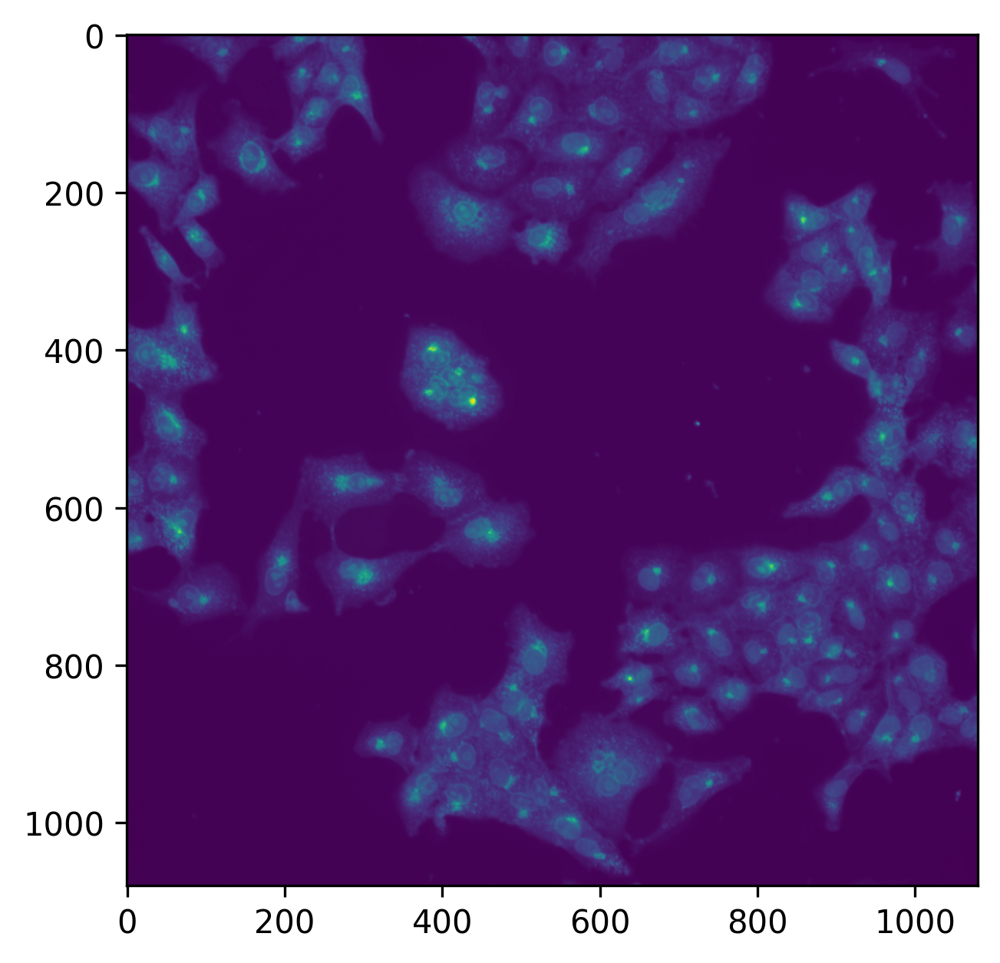

In [3]:
#@markdown ###Step 5: Read and Load all the images
#@markdown #####A random image will be shown as an example with each channel separated. If it is a single channel image, only the one channel will be shown
#imgs = [imread(f) for f in files]

imgs=[] #store all images
#Read images
for f in files:
  im=skimage.io.imread(f)
  n_dim=len(im.shape) #shape of image
  dim=im.shape #dimensions of image
  channel=min(dim) #channel will be dimension with min value usually
  channel_position=dim.index(channel)
  #if no of dim is 3 and channel is first index, swap channel to last index
  if n_dim==3 and channel_position==0:
    #print(dim)
    im=im.transpose(1,2,0)
    dim=im.shape
    #print("Shape changed")
  #print(dim)
  imgs.append(im)

nimg = len(imgs)
print("No of images loaded are: ", nimg)

print("Example Image:")

random_idx = random.choice(range(len(imgs)))
x=imgs[random_idx]
n_dim=len(x.shape)
file_name=os.path.basename(files[random_idx])
print(file_name+" has "+str(n_dim)+" dimensions/s")
if n_dim==3:
  channel_image=x.shape[2]
  fig, axs = plt.subplots(1, channel_image,figsize=(12,5))
  print("Image: %s" %(file_name))
  print("Image number: ",random_idx+1)
  for channel in range(channel_image):
      axs[channel].imshow(x[:,:,channel])
      axs[channel].set_title('Channel '+str(channel+1),size=15)
      axs[channel].axis('off')
  fig.tight_layout()
elif n_dim==2:
  print("One Channel")
  plt.imshow(x)
else:
  print("Channel number invalid or dimensions wrong. Image shape is: "+str(x.shape))

In [4]:
#@markdown #### **STEP 6**.  RUN THIS CELL to CHOOSE a cellpose model. Select the model you want from the dropdown list.
import ipywidgets as widgets
from IPython.display import display

model_choices = widgets.Dropdown(
    options=model_list,
    value='cyto2',
    description='Model Choice:',
    disabled=False,
)

def on_change(model_change):
  print("Model changed to :",model_change.new)
print("Choose MODEL from this list before proceeeding. Default is cyto2:")
model_choices.observe(on_change,names = 'value')

display(model_choices)



Choose MODEL from this list before proceeeding. Default is cyto2:


Dropdown(description='Model Choice:', index=4, options=('cyto', 'nuclei', 'tissuenet', 'livecell', 'cyto2', 'g…

In [5]:
#@markdown #### **STEP 7**.  Define the channels to use for segmentation

model_type= model_choices.value
print("Using model ",model_type)

#@markdown If the image has only one channel, leave it segmentation channel as 0
Channel_for_segmentation="0" #@param[0,1,2,3,4,5]
segment_channel=int(Channel_for_segmentation)

# @markdown ###If you choose cytoplasm, tick if you have a nuclear channel
Use_nuclear_channel= False #@param {type:"boolean"}
Nuclear_channel="3" #@param[1,2,3,4,5]
nuclear_channel=int(Nuclear_channel)

# @markdown ###If cells are elongated or have branches, tick this. It will use omnipose

#disabling omnipose for now as the flag has been removed from CELLPOSE
#omni= False #@param {type:"boolean"}


#@markdown ### Diameter of cell (pixels):
#@markdown #### Enter 0 if you don't know and cellpose will estimate it automatically. You can define this later as well.
Diameter =  0#@param {type:"number"}
diameter=Diameter

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus


#if model_choice=="Cytoplasm":
#  model_type="cyto"

##elif model_choice=="Cytoplasm2":
##  model_type="cyto2"

#elif model_choice=="Cytoplasm2_Omnipose":
#  model_type="cyto2_omni"

#elif model_choice=="Bacteria_Omnipose":
#  model_type="bact_omni"
#  diameter = 0

#elif model_choice=="Nuclei":
#  model_type="nuclei"


# channels = [cytoplasm, nucleus]
if model_type != "nuclei":
  if Use_nuclear_channel:
    channels=[segment_channel,nuclear_channel]
  else:
    channels=[segment_channel,0]
else: #nucleus
  channels=[segment_channel,0]




# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.CellposeModel(gpu=use_GPU, model_type=model_type, net_avg = True)#, omni = omni

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images
if diameter == 0:
  diameter = None
  print("Diameter is set to None. The size of the cells will be estimated on a per image basis")

Using model  cyto2
Diameter is set to None. The size of the cells will be estimated on a per image basis


Image: r06c14f05_median_aggregated


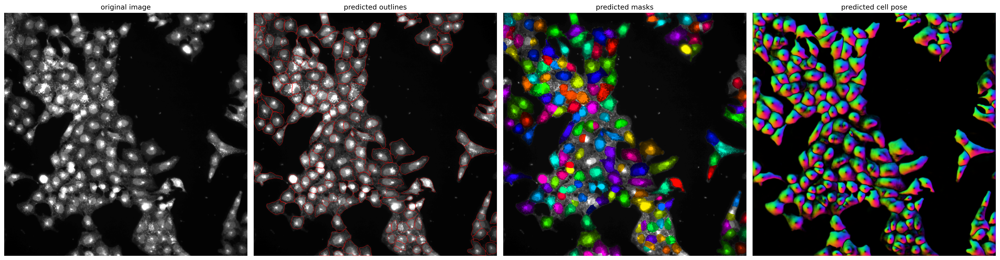

In [6]:
from skimage.util import img_as_ubyte

Image_Number =  2#@param {type:"number"}
Image_Number-=1 #indexing starts at zero
#print(Image_Number)
Diameter = 0#@param {type:"number"}
#Flow_Threshold=0.4#@param {type:"number"}
Flow_Threshold = 0.4 #@param {type:"slider", min:0.1, max:1.1, step:0.1}
flow_threshold=Flow_Threshold

#Cell_Probability_Threshold=-5#@param {type:"number"}
#Using slider to restrict values
Cell_Probability_Threshold=0 #@param {type:"slider", min:-6, max:6, step:1}
cellprob_threshold=Cell_Probability_Threshold


diameter=Diameter
if diameter == 0:
  diameter = None
if Image_Number == -1:
  Image_Number=0
  #print("Image_Number is set to zero, opening first image.")
try:
    image = imgs[Image_Number]
except IndexError as i:
   print("Image number does not exist",i)
   print("Actual no of images in folder: ",len(imgs))
print("Image: %s" %(os.path.splitext(os.path.basename(files[Image_Number]))[0]))
img1=imgs[Image_Number]

import cv2

masks, flows, styles = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
#masks, flows, styles, diams = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)



# DISPLAY RESULTS
from cellpose import plot
maski = masks
flowi = flows[0]

#convert to 8-bit if not so it can display properly in the graph
if img1.dtype!='uint8':
  img1=img_as_ubyte(img1)

fig = plt.figure(figsize=(24,8))
#if len(img1.shape)==3:
  #img_ch_plot = img1[:,:,segment_channel]img_ch_plot
plot.show_segmentation(fig, img1 , maski, flowi, channels=channels)
plt.tight_layout()
plt.show()

In [7]:
import skimage.measure
import pandas as pd
from tqdm import tqdm

metadata_file = "/content/drive/MyDrive/unzipped_data/metadata_BR00116991.csv"
metadata_df = pd.read_csv(metadata_file)
print("Loaded metadata. Head:\n", metadata_df.head())

meta_filename_col = "FileName_OrigRNA"
drug_label_col   = "Metadata_pert_iname"

if meta_filename_col not in metadata_df.columns:
    print(f"WARNING: No column '{meta_filename_col}' in metadata. Adjust code.")
if drug_label_col not in metadata_df.columns:
    print(f"WARNING: No column '{drug_label_col}' in metadata. Adjust code.")

all_cells = []


for idx, f in enumerate(tqdm(files, desc="Segmenting & extracting features")):
    img = imgs[idx]
    basename = os.path.basename(f)

    masks, flows, _ = model.eval(
        img,
        diameter=diameter,
        flow_threshold=flow_threshold,
        cellprob_threshold=cellprob_threshold,
        channels=channels
    )


    if len(img.shape) == 3:
        intensity_img = img[:,:,0]
    else:
        intensity_img = img


    if intensity_img.dtype != np.uint8:
        intensity_img = img_as_ubyte(intensity_img)

    props = skimage.measure.regionprops(masks, intensity_img)

    for prop in props:
        cell_info = {}
        cell_info["filename"] = basename
        cell_info["label"]    = prop.label


        cell_info["area"]               = prop.area
        cell_info["perimeter"]          = prop.perimeter
        cell_info["eccentricity"]       = prop.eccentricity
        cell_info["major_axis_length"]  = prop.major_axis_length
        cell_info["minor_axis_length"]  = prop.minor_axis_length
        cell_info["solidity"]           = prop.solidity


        cell_info["centroid_row"] = prop.centroid[0]
        cell_info["centroid_col"] = prop.centroid[1]


        cell_info["mean_intensity"]     = prop.mean_intensity
        cell_info["max_intensity"]      = prop.max_intensity
        cell_info["min_intensity"]      = prop.min_intensity

        all_cells.append(cell_info)


cells_df = pd.DataFrame(all_cells)
print("\nExtracted morphological features for", len(cells_df), "cells total.")
print("cells_df shape:", cells_df.shape)
print(cells_df.head())

Loaded metadata. Head:
    Unnamed: 0                FileName_OrigRNA  Metadata_ChannelID  \
0           0  r01c01f01p01-ch3sk1fk1fl1.tiff                   5   
1           1  r01c01f02p01-ch3sk1fk1fl1.tiff                   5   
2           2  r01c01f03p01-ch3sk1fk1fl1.tiff                   5   
3           3  r01c01f04p01-ch3sk1fk1fl1.tiff                   5   
4           4  r01c01f05p01-ch3sk1fk1fl1.tiff                   5   

  Metadata_Plate Metadata_Well  Metadata_Site  Metadata_AbsPositionZ  \
0     BR00116991           A01              1               0.134679   
1     BR00116991           A01              2               0.134679   
2     BR00116991           A01              3               0.134673   
3     BR00116991           A01              4               0.134674   
4     BR00116991           A01              5               0.134681   

   Metadata_PositionX  Metadata_PositionY  Metadata_PositionZ  Metadata_Row  \
0           -0.000323            0.000323        

Segmenting & extracting features: 100%|██████████| 2867/2867 [55:06<00:00,  1.15s/it]



Extracted morphological features for 425351 cells total.
cells_df shape: (425351, 13)
                           filename  label    area   perimeter  eccentricity  \
0  r02c16f01_median_aggregated.tiff      1   504.0   95.941125      0.887820   
1  r02c16f01_median_aggregated.tiff      2   532.0  120.012193      0.928336   
2  r02c16f01_median_aggregated.tiff      3   219.0   62.597980      0.885870   
3  r02c16f01_median_aggregated.tiff      4  2094.0  177.580736      0.209352   
4  r02c16f01_median_aggregated.tiff      5   750.0  110.911688      0.663625   

   major_axis_length  minor_axis_length  solidity  centroid_row  centroid_col  \
0          38.690925          17.805175  0.980545      6.621032    809.978175   
1          46.334595          17.224505  0.837795      6.548872    924.751880   
2          24.954437          11.577201  0.931915     17.894977    735.424658   
3          52.764085          51.594849  0.961433     44.461796    764.934097   
4          36.334978       

In [8]:
import re
import pandas as pd

def extract_rcf(filename):
    pattern = r"(r\d+c\d+f\d+)"
    match = re.search(pattern, filename)
    return match.group(1) if match else None

In [9]:
cells_df["rcf_id"] = cells_df["filename"].apply(extract_rcf)

metadata_df["rcf_id"] = metadata_df["FileName_OrigRNA"].apply(extract_rcf)

print("Cells with missing rcf_id:", sum(cells_df["rcf_id"].isna()))
print("Metadata rows with missing rcf_id:", sum(metadata_df["rcf_id"].isna()))

Cells with missing rcf_id: 0
Metadata rows with missing rcf_id: 0


In [10]:
merged_df = cells_df.merge(metadata_df, on="rcf_id", how="left")
print("\nMerged shape:", merged_df.shape)
print(merged_df.columns)


Merged shape: (425351, 31)
Index(['filename', 'label', 'area', 'perimeter', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'solidity', 'centroid_row',
       'centroid_col', 'mean_intensity', 'max_intensity', 'min_intensity',
       'rcf_id', 'Unnamed: 0', 'FileName_OrigRNA', 'Metadata_ChannelID',
       'Metadata_Plate', 'Metadata_Well', 'Metadata_Site',
       'Metadata_AbsPositionZ', 'Metadata_PositionX', 'Metadata_PositionY',
       'Metadata_PositionZ', 'Metadata_Row', 'Metadata_target',
       'Metadata_experiment_type', 'Metadata_cell_line', 'Metadata_pert_iname',
       'Metadata_gene', 'Metadata_pubchem_cid'],
      dtype='object')


In [11]:
merged_df = merged_df[~merged_df["Metadata_pert_iname"].isna()].copy()
print("Rows with known drug label:", merged_df.shape[0])
print(merged_df[["filename","FileName_OrigRNA","rcf_id","Metadata_pert_iname"]].head())

Rows with known drug label: 425351
                           filename                FileName_OrigRNA  \
0  r02c16f01_median_aggregated.tiff  r02c16f01p01-ch3sk1fk1fl1.tiff   
1  r02c16f01_median_aggregated.tiff  r02c16f01p01-ch3sk1fk1fl1.tiff   
2  r02c16f01_median_aggregated.tiff  r02c16f01p01-ch3sk1fk1fl1.tiff   
3  r02c16f01_median_aggregated.tiff  r02c16f01p01-ch3sk1fk1fl1.tiff   
4  r02c16f01_median_aggregated.tiff  r02c16f01p01-ch3sk1fk1fl1.tiff   

      rcf_id Metadata_pert_iname  
0  r02c16f01              PP-121  
1  r02c16f01              PP-121  
2  r02c16f01              PP-121  
3  r02c16f01              PP-121  
4  r02c16f01              PP-121  


In [12]:
merged_df.rename(columns={"Metadata_pert_iname": "drug"}, inplace=True)

non_feature_cols = [
    "filename", "label", "rcf_id", "FileName_OrigRNA", "drug",
    "Metadata_Plate", "Metadata_Well", "Metadata_ChannelID",
    "Metadata_Site", "Metadata_AbsPositionZ", "Metadata_PositionX",
    "Metadata_PositionY", "Metadata_PositionZ", "Metadata_Row",
    "Metadata_target", "Metadata_experiment_type", "Metadata_cell_line",
    "Metadata_gene", "Metadata_pubchem_cid", "Unnamed: 0"
]


import numpy as np

feature_cols = [
    c for c in merged_df.columns
    if c not in non_feature_cols
    and np.issubdtype(merged_df[c].dtype, np.number)
]

print("\nFeature columns:")
print(feature_cols)

X = merged_df[feature_cols].fillna(0)
y = merged_df["drug"]

print(f"\nX shape: {X.shape}, y shape: {y.shape}")
print("Example classes:", y.unique()[:5])


Feature columns:
['area', 'perimeter', 'eccentricity', 'major_axis_length', 'minor_axis_length', 'solidity', 'centroid_row', 'centroid_col', 'mean_intensity', 'max_intensity', 'min_intensity']

X shape: (425351, 11), y shape: (425351,)
Example classes: ['PP-121' 'racecadotril' 'BI-2536' 'isoflurane' 'CYT-997']


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    make_scorer
)


TOP_K_CLASSES = 10
DO_CLASS_FILTER = True
N_SPLITS = 5
RANDOM_STATE = 42
USE_BALANCED_CLASSWEIGHT = True
print("merged_df shape:", merged_df.shape)
print("merged_df columns:", merged_df.columns)

merged_df shape: (425351, 31)
merged_df columns: Index(['filename', 'label', 'area', 'perimeter', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'solidity', 'centroid_row',
       'centroid_col', 'mean_intensity', 'max_intensity', 'min_intensity',
       'rcf_id', 'Unnamed: 0', 'FileName_OrigRNA', 'Metadata_ChannelID',
       'Metadata_Plate', 'Metadata_Well', 'Metadata_Site',
       'Metadata_AbsPositionZ', 'Metadata_PositionX', 'Metadata_PositionY',
       'Metadata_PositionZ', 'Metadata_Row', 'Metadata_target',
       'Metadata_experiment_type', 'Metadata_cell_line', 'drug',
       'Metadata_gene', 'Metadata_pubchem_cid'],
      dtype='object')


In [14]:
class_counts = merged_df["drug"].value_counts()
top_classes = class_counts.index[:TOP_K_CLASSES].tolist()
print(f"Keeping top {TOP_K_CLASSES} classes:\n", top_classes)

subset_df = merged_df[merged_df["drug"].isin(top_classes)].copy()
print("After filtering shape:", subset_df.shape)

Keeping top 10 classes:
 ['DMSO', 'FK-866', 'lonafarnib', 'ZK-93423', 'GSK2110183', 'thiostrepton', 'thioguanine', 'nilvadipine', 'TFC-007', 'zamifenacin']
After filtering shape: (111409, 31)


In [15]:
group_cols = ["filename","drug"]
agg_df = subset_df.groupby(group_cols, as_index=False).median(numeric_only=True)

print("\nAfter image-level aggregation:")
print("agg_df shape:", agg_df.shape)
print("agg_df columns:", agg_df.columns)


After image-level aggregation:
agg_df shape: (644, 24)
agg_df columns: Index(['filename', 'drug', 'label', 'area', 'perimeter', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'solidity', 'centroid_row',
       'centroid_col', 'mean_intensity', 'max_intensity', 'min_intensity',
       'Unnamed: 0', 'Metadata_ChannelID', 'Metadata_Site',
       'Metadata_AbsPositionZ', 'Metadata_PositionX', 'Metadata_PositionY',
       'Metadata_PositionZ', 'Metadata_Row', 'Metadata_gene',
       'Metadata_pubchem_cid'],
      dtype='object')


In [16]:
non_feature_cols = ["filename","drug"]
numeric_cols = [
    c for c in agg_df.columns
    if c not in non_feature_cols
    and np.issubdtype(agg_df[c].dtype, np.number)
]

X = agg_df[numeric_cols].fillna(0)
y = agg_df["drug"].copy()

print("\nFinal dataset for classification:")
print(f"X shape: {X.shape}, y shape: {y.shape}, classes: {y.nunique()}")


Final dataset for classification:
X shape: (644, 22), y shape: (644,), classes: 10


In [17]:
print("\nClass distribution (top 10):")
print(y.value_counts().head(10))


Class distribution (top 10):
drug
DMSO            509
thiostrepton     18
FK-866           18
GSK2110183       18
ZK-93423         18
thioguanine      18
lonafarnib       18
TFC-007           9
zamifenacin       9
nilvadipine       9
Name: count, dtype: int64


In [18]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [19]:
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE)

if USE_BALANCED_CLASSWEIGHT:
    cw = 'balanced_subsample'
else:
    cw = None

clf = RandomForestClassifier(
    n_estimators=50,
    max_depth=20,
    class_weight=cw,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

from sklearn.model_selection import cross_val_score

scores = cross_val_score(
    estimator=clf,
    X=X_scaled,
    y=y,
    scoring='accuracy',
    cv=skf,
    n_jobs=-1
)

print(f"\nCross-validation (nsplits={N_SPLITS}) ACCURACY scores:", scores)
print(f"Mean accuracy: {scores.mean()*100:.2f}% ± {scores.std()*100:.2f}")


Cross-validation (nsplits=5) ACCURACY scores: [0.95348837 0.96899225 0.99224806 0.98449612 0.953125  ]
Mean accuracy: 97.05% ± 1.59



Single hold-out test accuracy: 99.22%

Classification Report (hold-out test):
              precision    recall  f1-score   support

        DMSO       0.99      1.00      1.00       102
      FK-866       1.00      1.00      1.00         3
  GSK2110183       1.00      1.00      1.00         3
     TFC-007       1.00      1.00      1.00         2
    ZK-93423       1.00      1.00      1.00         4
  lonafarnib       1.00      1.00      1.00         4
 nilvadipine       1.00      1.00      1.00         2
 thioguanine       1.00      1.00      1.00         4
thiostrepton       1.00      1.00      1.00         3
 zamifenacin       1.00      0.50      0.67         2

    accuracy                           0.99       129
   macro avg       1.00      0.95      0.97       129
weighted avg       0.99      0.99      0.99       129



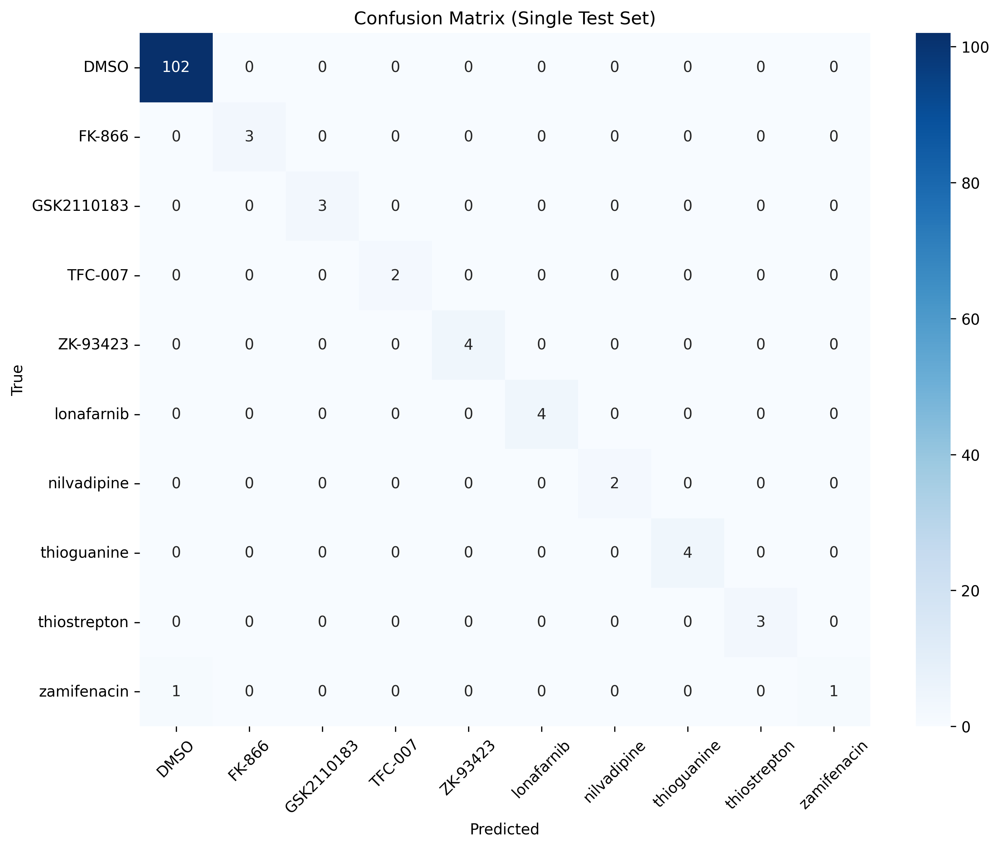

In [20]:
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled,
    y,
    test_size=0.2,
    stratify=y,
    random_state=RANDOM_STATE
)

clf_final = RandomForestClassifier(
    n_estimators=50,
    max_depth=20,
    class_weight=cw,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
clf_final.fit(X_train, y_train)

y_pred = clf_final.predict(X_test)

acc_test = accuracy_score(y_test, y_pred)
print(f"\nSingle hold-out test accuracy: {acc_test*100:.2f}%")

print("\nClassification Report (hold-out test):")
print(classification_report(y_test, y_pred, zero_division=0))

labels = np.unique(y_test)
cm = confusion_matrix(y_test, y_pred, labels=labels)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap="Blues")
plt.title("Confusion Matrix (Single Test Set)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [21]:
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.metrics import (
    make_scorer,
    f1_score,
    accuracy_score,
    recall_score,
    precision_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

print("\nShapes:", X.shape, y.shape, "Classes:", len(y.unique()))


Shapes: (644, 22) (644,) Classes: 10


In [22]:
scoring = {
    "accuracy": "accuracy",
    "macro_f1": make_scorer(f1_score, average="macro"),
    "macro_recall": make_scorer(recall_score, average="macro"),
    "macro_precision": make_scorer(precision_score, average="macro"),
}

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

base_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("rf", RandomForestClassifier(
        n_estimators=50,
        max_depth=20,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    ))
])

results = cross_validate(
    estimator=base_pipe,
    X=X,
    y=y,
    cv=skf,
    scoring=scoring,
    return_train_score=False
)

print("\nMetrics (No Oversampling)")
print("Accuracy (folds):", results['test_accuracy'])
print("Macro-F1   (folds):", results['test_macro_f1'])
print("Macro-Recall (folds):", results['test_macro_recall'])
print("Macro-Precision (folds):", results['test_macro_precision'])

print(f"Mean Accuracy: {results['test_accuracy'].mean()*100:.2f}%")
print(f"Mean Macro-F1: {results['test_macro_f1'].mean()*100:.2f}%")
print(f"Mean Macro-Recall: {results['test_macro_recall'].mean()*100:.2f}%")
print(f"Mean Macro-Precision: {results['test_macro_precision'].mean()*100:.2f}%")


Metrics (No Oversampling)
Accuracy (folds): [0.95348837 0.96899225 0.99224806 0.98449612 0.953125  ]
Macro-F1   (folds): [0.86285714 0.91188406 0.98522648 0.95665505 0.79711538]
Macro-Recall (folds): [0.79166667 0.88333333 0.975      0.95       0.75      ]
Macro-Precision (folds): [0.99444444 0.96380952 0.99902913 0.97402913 0.89439252]
Mean Accuracy: 97.05%
Mean Macro-F1: 90.27%
Mean Macro-Recall: 87.00%
Mean Macro-Precision: 96.51%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [23]:
oversample_pipe = Pipeline([
    ("smote", SMOTE(random_state=42)),
    ("scaler", StandardScaler()),
    ("rf", RandomForestClassifier(
        n_estimators=50,
        max_depth=20,

        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    ))
])

results_smote = cross_validate(
    estimator=oversample_pipe,
    X=X,
    y=y,
    cv=skf,
    scoring=scoring,
    return_train_score=False
)

print("\nCV with SMOTE inside each fold")
print("Accuracy (folds):", results_smote['test_accuracy'])
print("Macro-F1   (folds):", results_smote['test_macro_f1'])
print("Macro-Recall (folds):", results_smote['test_macro_recall'])
print("Macro-Precision (folds):", results_smote['test_macro_precision'])
print(f"Mean Accuracy: {results_smote['test_accuracy'].mean()*100:.2f}%")
print(f"Mean Macro-F1: {results_smote['test_macro_f1'].mean()*100:.2f}%")
print(f"Mean Macro-Recall: {results_smote['test_macro_recall'].mean()*100:.2f}%")
print(f"Mean Macro-Precision: {results_smote['test_macro_precision'].mean()*100:.2f}%")


CV with SMOTE inside each fold
Accuracy (folds): [0.99224806 0.99224806 0.98449612 1.         0.984375  ]
Macro-F1   (folds): [0.9795122  0.97142857 0.96569579 1.         0.96568627]
Macro-Recall (folds): [0.96666667 0.975      0.95       1.         0.95      ]
Macro-Precision (folds): [0.99902913 0.975      0.99807692 1.         0.99805825]
Mean Accuracy: 99.07%
Mean Macro-F1: 97.65%
Mean Macro-Recall: 96.83%
Mean Macro-Precision: 99.40%


In [24]:
from imblearn.under_sampling import RandomUnderSampler
combined_pipe = Pipeline([
    ("rus", RandomUnderSampler(random_state=42)),
    ("smote", SMOTE(random_state=42)),
    ("scaler", StandardScaler()),
    ("rf", RandomForestClassifier(
        n_estimators=50,
        max_depth=20,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    ))
])

results_combined = cross_validate(
    estimator=combined_pipe,
    X=X,
    y=y,
    cv=skf,
    scoring=scoring,
    return_train_score=False
)

print("\nUndersample, SMOTE and ClassWeight")
print("Accuracy (folds):", results_combined['test_accuracy'])
print("Macro-F1   (folds):", results_combined['test_macro_f1'])
print("Macro-Recall (folds):", results_combined['test_macro_recall'])
print("Macro-Precision (folds):", results_combined['test_macro_precision'])
print(f"Mean Accuracy: {results_combined['test_accuracy'].mean()*100:.2f}%")
print(f"Mean Macro-F1: {results_combined['test_macro_f1'].mean()*100:.2f}%")
print(f"Mean Macro-Recall: {results_combined['test_macro_recall'].mean()*100:.2f}%")
print(f"Mean Macro-Precision: {results_combined['test_macro_precision'].mean()*100:.2f}%")


Undersample, SMOTE and ClassWeight
Accuracy (folds): [0.96124031 0.97674419 0.96899225 0.99224806 0.9921875 ]
Macro-F1   (folds): [0.88811064 0.90793651 0.8922058  0.97142857 0.93333333]
Macro-Recall (folds): [0.92205882 0.91666667 0.91568627 0.975      0.95      ]
Macro-Precision (folds): [0.86333333 0.92166667 0.89666667 0.975      0.95      ]
Mean Accuracy: 97.83%
Mean Macro-F1: 91.86%
Mean Macro-Recall: 93.59%
Mean Macro-Precision: 92.13%


Confusion Matrix
[[509   0   0   0   0   0   0   0   0   0]
 [  0  18   0   0   0   0   0   0   0   0]
 [  0   0  17   0   0   0   1   0   0   0]
 [  1   0   0   8   0   0   0   0   0   0]
 [  0   0   0   0  18   0   0   0   0   0]
 [  6   0   0   0   0  12   0   0   0   0]
 [  2   0   0   0   0   0  15   1   0   0]
 [  5   0   0   0   0   0   0  13   0   0]
 [  1   0   0   0   0   0   0   0   8   0]
 [  2   0   0   0   0   0   0   0   0   7]]
Classification Report
              precision    recall  f1-score   support

        DMSO       0.97      1.00      0.98       509
      FK-866       1.00      0.94      0.97        18
  GSK2110183       1.00      1.00      1.00        18
     TFC-007       1.00      0.89      0.94         9
    ZK-93423       1.00      0.67      0.80        18
  lonafarnib       0.93      0.72      0.81        18
 nilvadipine       1.00      0.78      0.88         9
 thioguanine       0.94      0.83      0.88        18
thiostrepton       1.00      1.00      1.00

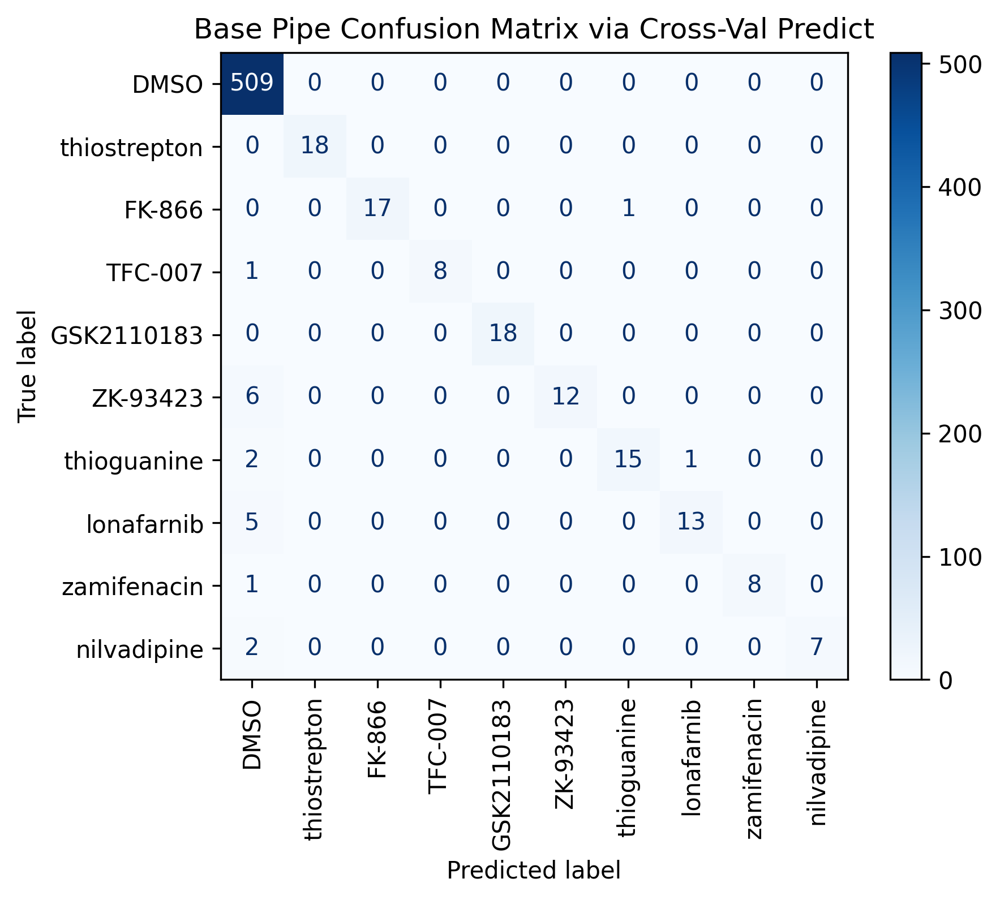

In [25]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

y_pred_base = cross_val_predict(
    estimator=base_pipe,
    X=X,
    y=y,
    cv=skf
)

cm_base = confusion_matrix(y, y_pred_base, labels=y.unique())
print("Confusion Matrix")
print(cm_base)

print("Classification Report")
print(classification_report(y, y_pred_base))

disp = ConfusionMatrixDisplay(confusion_matrix=cm_base, display_labels=y.unique())
disp.plot(cmap="Blues", xticks_rotation='vertical')
plt.title("Base Pipe Confusion Matrix via Cross-Val Predict")
plt.show()